<h1>Frequency Domain Steganography</h1>

### Necessary Imports & Declarations

In [1]:
import os
import glob
import cv2
import torch
import numpy as np
import matplotlib.pyplot as plt
import random
import pandas as pd
import gc
import pickle
#matplotlib inline

from PIL import Image
from torchvision import transforms
from skimage.filters import threshold_otsu

from deepgaze.saliency_map import FasaSaliencyMapping

# Define the directory paths
train_dir = os.path.join("data2", "imagenet", "train")
val_dir   = os.path.join("data2", "imagenet", "val")

LOG_DIR = "SteganoGAN/logs"
SAL_OUTPUT_DIR = "SteganoGAN/logs/saliency_maps"
CHART_OUTPUT_DIR = "SteganoGAN/logs/charts"
#Add Log Files
os.makedirs(LOG_DIR, exist_ok=True)
os.makedirs(SAL_OUTPUT_DIR, exist_ok=True)
os.makedirs(CHART_OUTPUT_DIR, exist_ok=True)

#GLOBAL CONSTANTS FOR BATCH PROCESSING
BATCH_INDEX = globals().get("BATCH_INDEX", 0)

<h3>Logging FN</h3>

In [2]:
def log_to_file(text, file_name):
    full_path = os.path.join(LOG_DIR, file_name)
    with open(full_path, "a") as f:
        f.write(text + "\n")


### Preview function to see output of each step.

In [3]:
# train_dir = os.path.join("data", "imagenet", "train")

train_dir = os.path.join("data2/imagenet/train")
all_image_paths = sorted(list(set(glob.glob(os.path.join(train_dir, '*.*')))))

# Limit to first 20,000 images only
batch_paths = all_image_paths[BATCH_INDEX * 1000 : (BATCH_INDEX + 1) * 1000]

# Batch size
BATCH_SIZE = 1000

print(f"[INFO] Batch {BATCH_INDEX + 1}: Loaded {len(batch_paths)} images")


[INFO] Batch 1: Loaded 1000 images


### Load and Preprocess Images

In [4]:
# Load each image, convert to RGB, resize to 224x224, and normalize to [0,1]
from PIL import Image
import numpy as np

sample_images = []
titles = []

for path in batch_paths:
    try:
        img = Image.open(path).convert("RGB").resize((224, 224))
        sample_images.append(np.array(img) / 255.0)
        titles.append(os.path.basename(path))
    except Exception as e:
        print(f"[ERROR] Could not load {path}: {e}")

# Display the resized original images horizontally
#fig, axes = plt.subplots(1, len(sample_images), figsize=(len(sample_images) * 4, 4))
#for ax, img, title in zip(axes, sample_images, titles):
#    ax.imshow(img)
#    ax.set_title(title)
#    ax.axis('off')
#plt.tight_layout()
#plt.show()

### DeepGaze Saliency Mapping

In [5]:
def gen_saliency_maps(images):
    saliency_maps = []
    binary_masks = []

    for idx, img in enumerate(images):
        saliency = FasaSaliencyMapping(image_h=224, image_w=224)
        image_uint8 = (img * 255).astype(np.uint8)
        print(f"Processing image {idx+1}: shape {image_uint8.shape}, min {image_uint8.min()}, max {image_uint8.max()}")
        sal_map = saliency.returnMask(image_uint8, tot_bins=8, format='RGB')
        saliency_maps.append(sal_map)

        sal_map_norm = cv2.normalize(sal_map, None, 0, 255, cv2.NORM_MINMAX).astype('uint8')
        thresh_val = threshold_otsu(sal_map_norm)
        binary_mask = (sal_map_norm < thresh_val).astype(np.uint8) * 255
        binary_masks.append(binary_mask)

    return np.array(saliency_maps), np.array(binary_masks)

saliency_maps, binary_masks = gen_saliency_maps(sample_images)

Processing image 1: shape (224, 224, 3), min 0, max 255
Processing image 2: shape (224, 224, 3), min 1, max 201
Processing image 3: shape (224, 224, 3), min 0, max 255
Processing image 4: shape (224, 224, 3), min 4, max 244
Processing image 5: shape (224, 224, 3), min 0, max 255
Processing image 6: shape (224, 224, 3), min 1, max 255
Processing image 7: shape (224, 224, 3), min 0, max 255
Processing image 8: shape (224, 224, 3), min 0, max 255
Processing image 9: shape (224, 224, 3), min 0, max 255
Processing image 10: shape (224, 224, 3), min 0, max 255
Processing image 11: shape (224, 224, 3), min 0, max 254
Processing image 12: shape (224, 224, 3), min 12, max 255
Processing image 13: shape (224, 224, 3), min 0, max 255
Processing image 14: shape (224, 224, 3), min 0, max 255
Processing image 15: shape (224, 224, 3), min 0, max 255
Processing image 16: shape (224, 224, 3), min 1, max 255
Processing image 17: shape (224, 224, 3), min 3, max 249
Processing image 18: shape (224, 224, 3

<h2>Frequency Domain Embedding (DCT)</h2>

### Gnereate the block mask

In [6]:
def compute_block_mask(saliency_map, block_size=16, threshold=0.05):
    """
    Compute a binary mask indicating which blocks are good for embedding
    based on average saliency per block.

    Args:
        saliency_map (numpy array): Grayscale saliency map (HxW), normalized [0,1]
        block_size (int): Block size, default 16
        threshold (float): Saliency threshold

    Returns:
        mask (numpy array): Binary mask (h_blocks x w_blocks), 1=good for embedding, 0=skip
    """
    h, w = saliency_map.shape
    h_blocks = h // block_size
    w_blocks = w // block_size

    mask = np.zeros((h_blocks, w_blocks), dtype=np.uint8)

    for i in range(h_blocks):
        for j in range(w_blocks):
            y_start = i * block_size
            x_start = j * block_size
            block = saliency_map[y_start:y_start + block_size, x_start:x_start + block_size]
            avg_saliency = np.mean(block)

            if avg_saliency < threshold:
                mask[i, j] = 1  # Good block for embedding

    return mask


### Overlay the Mask on the Image

In [7]:
def overlay_blocks_on_image(image, block_mask, block_size=16):
    """
    Overlay green/red rectangles on the original image based on the block mask.

    Args:
        image (numpy array): Original RGB image (HxWx3), uint8
        block_mask (numpy array): Binary block mask (h_blocks x w_blocks)
        block_size (int): Block size, default 16

    Returns:
        overlay_img (numpy array): Image with green/red block overlays
    """
    overlay_img = image.copy()
    h_blocks, w_blocks = block_mask.shape

    for i in range(h_blocks):
        for j in range(w_blocks):
            y_start = i * block_size
            x_start = j * block_size

            if block_mask[i, j] == 1:
                color = (0, 255, 0)  # Green for good block
            else:
                color = (255, 0, 0)  # Red for skip block

            # Draw rectangle
            cv2.rectangle(
                overlay_img,
                (x_start, y_start),
                (x_start + block_size - 1, y_start + block_size - 1),
                color,
                1
            )

    return overlay_img


### Display Saliency Maps and Block Overlays

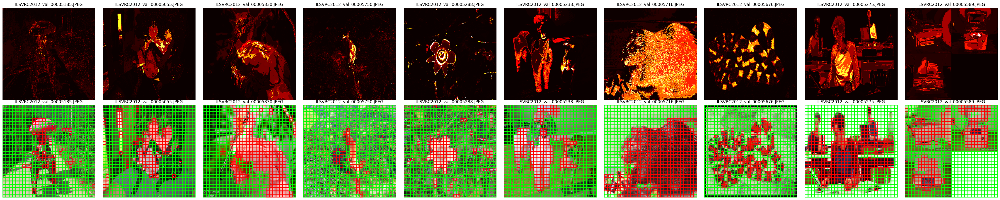

Image 1: Total Blocks = 784, Good Blocks = 307, Bad Blocks = 477
Image 2: Total Blocks = 784, Good Blocks = 475, Bad Blocks = 309
Image 3: Total Blocks = 784, Good Blocks = 591, Bad Blocks = 193
Image 4: Total Blocks = 784, Good Blocks = 529, Bad Blocks = 255
Image 5: Total Blocks = 784, Good Blocks = 627, Bad Blocks = 157
Image 6: Total Blocks = 784, Good Blocks = 414, Bad Blocks = 370
Image 7: Total Blocks = 784, Good Blocks = 628, Bad Blocks = 156
Image 8: Total Blocks = 784, Good Blocks = 406, Bad Blocks = 378
Image 9: Total Blocks = 784, Good Blocks = 453, Bad Blocks = 331
Image 10: Total Blocks = 784, Good Blocks = 603, Bad Blocks = 181
Image 11: Total Blocks = 784, Good Blocks = 453, Bad Blocks = 331
Image 12: Total Blocks = 784, Good Blocks = 747, Bad Blocks = 37
Image 13: Total Blocks = 784, Good Blocks = 773, Bad Blocks = 11
Image 14: Total Blocks = 784, Good Blocks = 644, Bad Blocks = 140
Image 15: Total Blocks = 784, Good Blocks = 652, Bad Blocks = 132
Image 16: Total Block

In [8]:
import random

def display_saliency_and_overlay(saliency_maps, overlay_images, titles=None):
    """
    Display saliency maps and overlay images in two rows:
    - Row 0: Saliency maps (hot colormap)
    - Row 1: Overlay images with green/red blocks

    Args:
        saliency_maps (list): List of saliency maps (HxW), normalized [0,1] or [0,255]
        overlay_images (list): List of overlay images (HxWx3), uint8
        titles (list): Optional list of titles for each image
    """
    # Randomly select 10 indices
    num_images = len(saliency_maps)
    selected_indices = random.sample(range(num_images), min(10, num_images))

    # Filter the saliency maps, overlay images, and titles based on selected indices
    saliency_maps = [saliency_maps[i] for i in selected_indices]
    overlay_images = [overlay_images[i] for i in selected_indices]
    if titles:
        titles = [titles[i] for i in selected_indices]

    # Display the selected images
    fig, axes = plt.subplots(2, len(saliency_maps), figsize=(len(saliency_maps) * 4, 8))

    for i in range(len(saliency_maps)):
        sal_map = saliency_maps[i]
        overlay_img = overlay_images[i]

        # Normalize saliency map for display
        if sal_map.max() <= 1.0:
            sal_map_vis = (sal_map * 255).astype(np.uint8)
        else:
            sal_map_vis = sal_map.astype(np.uint8)

        # Saliency map
        axes[0, i].imshow(sal_map_vis, cmap='hot')
        axes[0, i].set_title(f"Saliency Map {i+1}" if not titles else titles[i])
        axes[0, i].axis('off')

        # Overlay image
        axes[1, i].imshow(overlay_img)
        axes[1, i].set_title(f"Block Overlay {i+1}" if not titles else titles[i])
        axes[1, i].axis('off')

    plt.tight_layout()
    plt.show()


# Parameters
block_size = 8  # Changed to 8 after 16
threshold = 0.05

# Containers for masks and overlay images
block_masks = []
overlay_images = []

# Process each image and saliency map
for img, sal_map in zip(sample_images, saliency_maps):
    # Ensure image is uint8
    img_uint8 = (img * 255).astype(np.uint8) if img.max() <= 1.0 else img

    # Normalize saliency map if necessary
    sal_map_norm = sal_map / 255.0 if sal_map.max() > 1.0 else sal_map

    # Step 1: Compute block mask
    block_mask = compute_block_mask(sal_map_norm, block_size, threshold)
    block_masks.append(block_mask)

    # Step 2: Overlay block mask on image
    overlay_img = overlay_blocks_on_image(img_uint8, block_mask, block_size)
    overlay_images.append(overlay_img)

# Step 3: Display results for 10 random images
display_saliency_and_overlay(saliency_maps, overlay_images, titles)

# Calculate and display block statistics for all images
for idx, block_mask in enumerate(block_masks):
    total_blocks = block_mask.size
    good_blocks = np.sum(block_mask == 1)
    bad_blocks = total_blocks - good_blocks

    print(f"Image {idx+1}: Total Blocks = {total_blocks}, Good Blocks = {good_blocks}, Bad Blocks = {bad_blocks}")

### Calculate Capacity

In [9]:
def calculate_embedding_capacity(block_mask, bits_per_block=4):
    """
    Calculate embedding capacity based on block mask and bits per block.
    
    Args:
        block_mask (numpy array): Binary mask of blocks (h_blocks x w_blocks)
        bits_per_block (int): Number of bits you can embed per block (default: 4)
    
    Returns:
        total_bits (int): Total embedding capacity in bits
    """
    num_good_blocks = np.sum(block_mask == 1)
    total_bits = num_good_blocks * bits_per_block
    print(f"Embedding capacity: {total_bits} bits ({num_good_blocks} blocks x {bits_per_block} bits/block)")
    return total_bits



### Generate Random Payload Bits

In [10]:
def generate_random_payload(num_bits):
    """
    Generate a random payload as a bitstream.
    
    Args:
        num_bits (int): Number of bits to generate
    
    Returns:
        payload_bits (numpy array): Array of 0s and 1s
    """
    payload_bits = np.random.randint(0, 2, size=num_bits, dtype=np.uint8)
    print(f"Generated random payload of {num_bits} bits.")
    return payload_bits


### Convert String Message to Bits

In [11]:
def string_to_bits(message):
    """
    Convert a string message to a bitstream (list of 0s and 1s).
    
    Args:
        message (str): Text message to convert
    
    Returns:
        payload_bits (numpy array): Bitstream of the message
    """
    byte_array = bytearray(message, 'utf-8')
    bits = []
    for byte in byte_array:
        bits.extend([int(bit) for bit in format(byte, '08b')])
    
    payload_bits = np.array(bits, dtype=np.uint8)
    print(f"Converted message '{message}' to {len(payload_bits)} bits.")
    return payload_bits


In [12]:
# Assume you already have block_masks from earlier

# Step 1: Calculate capacity for each image
bits_per_block = 4  # Or adjust based on your DCT embedding plan
capacities = [calculate_embedding_capacity(block_mask, bits_per_block=bits_per_block) for block_mask in block_masks]

# Step 2a: Generate random payloads for each image
# random_payloads = [generate_random_payload(capacity) for capacity in capacities]

# Optional Step 2b: Convert string message to bits (if you want)
message = "War Eagle!"
# The quick brown fox jumps over the lazy dog!
message_payload = string_to_bits(message)

# where to dump per‑image feature data for extraction
# where to dump features for extraction
FEATURES_DIR = "extraction_features"
os.makedirs(FEATURES_DIR, exist_ok=True)

# header constants
SIGNATURE   = 0xBEEF
SIG_BITS    = 16
LENGTH_BITS = 32

def int_to_bits(val: int, bits: int) -> list[int]:
    """Convert integer to big‑endian bit list."""
    return [(val >> (bits - 1 - i)) & 1 for i in range(bits)]

# assume you already have:
#  capacities: List[int]
#  message_payload: np.ndarray of 0/1 bits
#  filtered_titles: List[str]
#  filtered_candidates_per_image: List[List[…]]
#  filtered_dct_blocks_per_image: List[List[dict]]

# convert NumPy payload to Python list once
message_bits = list(message_payload)

payloads: list[list[int]] = []
for idx, capacity in enumerate(capacities):
    # trim message if needed
    base = message_bits.copy()
    max_msg_bits = capacity - (SIG_BITS + LENGTH_BITS)
    if len(base) > max_msg_bits:
        print(f"⚠️ Message too long for image {idx}, trimming to {max_msg_bits} bits")
        base = base[:max_msg_bits]

    # build header + payload
    header = int_to_bits(SIGNATURE, SIG_BITS) + int_to_bits(len(base), LENGTH_BITS)
    full_payload = header + base 
    payloads.append(full_payload)

    print(f"Image {idx}: payload bits = {len(full_payload)}/{capacity}")

Embedding capacity: 1228 bits (307 blocks x 4 bits/block)
Embedding capacity: 1900 bits (475 blocks x 4 bits/block)
Embedding capacity: 2364 bits (591 blocks x 4 bits/block)
Embedding capacity: 2116 bits (529 blocks x 4 bits/block)
Embedding capacity: 2508 bits (627 blocks x 4 bits/block)
Embedding capacity: 1656 bits (414 blocks x 4 bits/block)
Embedding capacity: 2512 bits (628 blocks x 4 bits/block)
Embedding capacity: 1624 bits (406 blocks x 4 bits/block)
Embedding capacity: 1812 bits (453 blocks x 4 bits/block)
Embedding capacity: 2412 bits (603 blocks x 4 bits/block)
Embedding capacity: 1812 bits (453 blocks x 4 bits/block)
Embedding capacity: 2988 bits (747 blocks x 4 bits/block)
Embedding capacity: 3092 bits (773 blocks x 4 bits/block)
Embedding capacity: 2576 bits (644 blocks x 4 bits/block)
Embedding capacity: 2608 bits (652 blocks x 4 bits/block)
Embedding capacity: 2752 bits (688 blocks x 4 bits/block)
Embedding capacity: 1876 bits (469 blocks x 4 bits/block)
Embedding capa

## STEP 6 - Qunatization tables for luminance and chrominance

### Extract JPEG Quantization Tables (QnT)

In [13]:
def extract_quantization_tables(image_paths):
    """
    Extract JPEG quantization tables from image files.

    Args:
        image_paths (list): List of file paths to images.

    Returns:
        qtables_list (list): List of quantization tables for each image.
    """
    qtables_list = []

    for idx, img_path in enumerate(image_paths):
        try:
            img = Image.open(img_path)

            # Check if it's JPEG
            if img.format != 'JPEG':
                print(f"[{idx+1}] {os.path.basename(img_path)} is not a JPEG image. Skipping.")
                qtables_list.append(None)
                continue

            qtables = img.quantization
            qtables_list.append(qtables)

            print(f"[{idx+1}] Extracted quantization tables from {os.path.basename(img_path)}")

        except Exception as e:
            print(f"[{idx+1}] Error processing {img_path}: {e}")
            qtables_list.append(None)

    return qtables_list

# Run it on your sample image paths
qtables_list = extract_quantization_tables(batch_paths)

[1] Extracted quantization tables from ILSVRC2012_val_00005001.JPEG
[2] Extracted quantization tables from ILSVRC2012_val_00005002.JPEG
[3] Extracted quantization tables from ILSVRC2012_val_00005003.JPEG
[4] Extracted quantization tables from ILSVRC2012_val_00005004.JPEG
[5] Extracted quantization tables from ILSVRC2012_val_00005005.JPEG
[6] Extracted quantization tables from ILSVRC2012_val_00005006.JPEG
[7] Extracted quantization tables from ILSVRC2012_val_00005007.JPEG
[8] Extracted quantization tables from ILSVRC2012_val_00005008.JPEG
[9] Extracted quantization tables from ILSVRC2012_val_00005009.JPEG
[10] Extracted quantization tables from ILSVRC2012_val_00005010.JPEG
[11] Extracted quantization tables from ILSVRC2012_val_00005011.JPEG
[12] Extracted quantization tables from ILSVRC2012_val_00005012.JPEG
[13] Extracted quantization tables from ILSVRC2012_val_00005013.JPEG
[14] Extracted quantization tables from ILSVRC2012_val_00005014.JPEG
[15] Extracted quantization tables from ILS

Visualize the QnT Tables (for Understanding)

In [14]:
import random

def display_quantization_tables_sample(qtables_list, image_titles, sample_size=10):
    """
    Display quantization tables for a random sample of images in a readable format.

    Args:
        qtables_list (list): List of quantization tables.
        image_titles (list): Corresponding titles or filenames.
        sample_size (int): Number of images to sample and display.
    """
    # Randomly select indices for sampling
    sampled_indices = random.sample(range(len(qtables_list)), min(sample_size, len(qtables_list)))

    for idx in sampled_indices:
        qtables = qtables_list[idx]
        print(f"\n=== Quantization Tables for Image {idx+1}: {image_titles[idx]} ===")
        
        if qtables is None:
            print("No quantization table extracted.")
            continue

        for table_id, qtable in qtables.items():
            qtable_matrix = np.array(qtable).reshape((8, 8))
            
            df = pd.DataFrame(qtable_matrix)
            print(f"\nTable {table_id} ({'Luminance' if table_id == 0 else 'Chrominance'}):")
            display(df)

# Visualize the quantization tables for a sample of 10 images
display_quantization_tables_sample(qtables_list, titles, sample_size=10)


=== Quantization Tables for Image 413: ILSVRC2012_val_00005413.JPEG ===

Table 0 (Luminance):


,0,1,2,3,4,5,6,7
0,1,1,1,1,2,3,4,5
1,1,1,1,2,2,5,5,4
2,1,1,1,2,3,5,6,4
3,1,1,2,2,4,7,6,5
4,1,2,3,4,5,9,8,6
5,2,3,4,5,6,8,9,7
6,4,5,6,7,8,10,10,8
7,6,7,8,8,9,8,8,8



Table 1 (Chrominance):


,0,1,2,3,4,5,6,7
0,1,1,2,4,8,8,8,8
1,1,2,2,5,8,8,8,8
2,2,2,4,8,8,8,8,8
3,4,5,8,8,8,8,8,8
4,8,8,8,8,8,8,8,8
5,8,8,8,8,8,8,8,8
6,8,8,8,8,8,8,8,8
7,8,8,8,8,8,8,8,8



=== Quantization Tables for Image 187: ILSVRC2012_val_00005187.JPEG ===

Table 0 (Luminance):


,0,1,2,3,4,5,6,7
0,4,3,2,4,6,10,12,15
1,3,3,3,5,6,14,14,13
2,3,3,4,6,10,14,17,13
3,3,4,5,7,12,21,19,15
4,4,5,9,13,16,26,25,18
5,6,8,13,15,19,25,27,22
6,12,15,19,21,25,29,29,24
7,17,22,23,24,27,24,25,24



Table 1 (Chrominance):


,0,1,2,3,4,5,6,7
0,4,4,6,11,24,24,24,24
1,4,5,6,16,24,24,24,24
2,6,6,13,24,24,24,24,24
3,11,16,24,24,24,24,24,24
4,24,24,24,24,24,24,24,24
5,24,24,24,24,24,24,24,24
6,24,24,24,24,24,24,24,24
7,24,24,24,24,24,24,24,24



=== Quantization Tables for Image 751: ILSVRC2012_val_00005751.JPEG ===

Table 0 (Luminance):


,0,1,2,3,4,5,6,7
0,1,1,1,1,2,3,4,5
1,1,1,1,2,2,5,5,4
2,1,1,1,2,3,5,6,4
3,1,1,2,2,4,7,6,5
4,1,2,3,4,5,9,8,6
5,2,3,4,5,6,8,9,7
6,4,5,6,7,8,10,10,8
7,6,7,8,8,9,8,8,8



Table 1 (Chrominance):


,0,1,2,3,4,5,6,7
0,1,1,2,4,8,8,8,8
1,1,2,2,5,8,8,8,8
2,2,2,4,8,8,8,8,8
3,4,5,8,8,8,8,8,8
4,8,8,8,8,8,8,8,8
5,8,8,8,8,8,8,8,8
6,8,8,8,8,8,8,8,8
7,8,8,8,8,8,8,8,8



=== Quantization Tables for Image 224: ILSVRC2012_val_00005224.JPEG ===

Table 0 (Luminance):


,0,1,2,3,4,5,6,7
0,1,1,1,1,2,3,4,5
1,1,1,1,2,2,5,5,4
2,1,1,1,2,3,5,6,4
3,1,1,2,2,4,7,6,5
4,1,2,3,4,5,9,8,6
5,2,3,4,5,6,8,9,7
6,4,5,6,7,8,10,10,8
7,6,7,8,8,9,8,8,8



Table 1 (Chrominance):


,0,1,2,3,4,5,6,7
0,1,1,2,4,8,8,8,8
1,1,2,2,5,8,8,8,8
2,2,2,4,8,8,8,8,8
3,4,5,8,8,8,8,8,8
4,8,8,8,8,8,8,8,8
5,8,8,8,8,8,8,8,8
6,8,8,8,8,8,8,8,8
7,8,8,8,8,8,8,8,8



=== Quantization Tables for Image 430: ILSVRC2012_val_00005430.JPEG ===

Table 0 (Luminance):


,0,1,2,3,4,5,6,7
0,6,4,4,6,10,16,20,24
1,5,5,6,8,10,23,24,22
2,6,5,6,10,16,23,28,22
3,6,7,9,12,20,35,32,25
4,7,9,15,22,27,44,41,31
5,10,14,22,26,32,42,45,37
6,20,26,31,35,41,48,48,40
7,29,37,38,39,45,40,41,40



Table 1 (Chrominance):


,0,1,2,3,4,5,6,7
0,7,7,10,19,40,40,40,40
1,7,8,10,26,40,40,40,40
2,10,10,22,40,40,40,40,40
3,19,26,40,40,40,40,40,40
4,40,40,40,40,40,40,40,40
5,40,40,40,40,40,40,40,40
6,40,40,40,40,40,40,40,40
7,40,40,40,40,40,40,40,40



=== Quantization Tables for Image 745: ILSVRC2012_val_00005745.JPEG ===

Table 0 (Luminance):


,0,1,2,3,4,5,6,7
0,1,1,1,1,2,3,4,5
1,1,1,1,2,2,5,5,4
2,1,1,1,2,3,5,6,4
3,1,1,2,2,4,7,6,5
4,1,2,3,4,5,9,8,6
5,2,3,4,5,6,8,9,7
6,4,5,6,7,8,10,10,8
7,6,7,8,8,9,8,8,8



Table 1 (Chrominance):


,0,1,2,3,4,5,6,7
0,1,1,2,4,8,8,8,8
1,1,2,2,5,8,8,8,8
2,2,2,4,8,8,8,8,8
3,4,5,8,8,8,8,8,8
4,8,8,8,8,8,8,8,8
5,8,8,8,8,8,8,8,8
6,8,8,8,8,8,8,8,8
7,8,8,8,8,8,8,8,8



=== Quantization Tables for Image 140: ILSVRC2012_val_00005140.JPEG ===

Table 0 (Luminance):


,0,1,2,3,4,5,6,7
0,1,1,1,1,2,3,4,5
1,1,1,1,2,2,5,5,4
2,1,1,1,2,3,5,6,4
3,1,1,2,2,4,7,6,5
4,1,2,3,4,5,9,8,6
5,2,3,4,5,6,8,9,7
6,4,5,6,7,8,10,10,8
7,6,7,8,8,9,8,8,8



Table 1 (Chrominance):


,0,1,2,3,4,5,6,7
0,1,1,2,4,8,8,8,8
1,1,2,2,5,8,8,8,8
2,2,2,4,8,8,8,8,8
3,4,5,8,8,8,8,8,8
4,8,8,8,8,8,8,8,8
5,8,8,8,8,8,8,8,8
6,8,8,8,8,8,8,8,8
7,8,8,8,8,8,8,8,8



=== Quantization Tables for Image 203: ILSVRC2012_val_00005203.JPEG ===

Table 0 (Luminance):


,0,1,2,3,4,5,6,7
0,1,1,1,1,2,3,4,5
1,1,1,1,2,2,5,5,4
2,1,1,1,2,3,5,6,4
3,1,1,2,2,4,7,6,5
4,1,2,3,4,5,9,8,6
5,2,3,4,5,6,8,9,7
6,4,5,6,7,8,10,10,8
7,6,7,8,8,9,8,8,8



Table 1 (Chrominance):


,0,1,2,3,4,5,6,7
0,1,1,2,4,8,8,8,8
1,1,2,2,5,8,8,8,8
2,2,2,4,8,8,8,8,8
3,4,5,8,8,8,8,8,8
4,8,8,8,8,8,8,8,8
5,8,8,8,8,8,8,8,8
6,8,8,8,8,8,8,8,8
7,8,8,8,8,8,8,8,8



=== Quantization Tables for Image 131: ILSVRC2012_val_00005131.JPEG ===

Table 0 (Luminance):


,0,1,2,3,4,5,6,7
0,1,1,1,1,2,3,4,5
1,1,1,1,2,2,5,5,4
2,1,1,1,2,3,5,6,4
3,1,1,2,2,4,7,6,5
4,1,2,3,4,5,9,8,6
5,2,3,4,5,6,8,9,7
6,4,5,6,7,8,10,10,8
7,6,7,8,8,9,8,8,8



Table 1 (Chrominance):


,0,1,2,3,4,5,6,7
0,1,1,2,4,8,8,8,8
1,1,2,2,5,8,8,8,8
2,2,2,4,8,8,8,8,8
3,4,5,8,8,8,8,8,8
4,8,8,8,8,8,8,8,8
5,8,8,8,8,8,8,8,8
6,8,8,8,8,8,8,8,8
7,8,8,8,8,8,8,8,8



=== Quantization Tables for Image 397: ILSVRC2012_val_00005397.JPEG ===

Table 0 (Luminance):


,0,1,2,3,4,5,6,7
0,3,2,2,3,5,8,10,12
1,2,2,3,4,5,12,12,11
2,3,3,3,5,8,11,14,11
3,3,3,4,6,10,17,16,12
4,4,4,7,11,14,22,21,15
5,5,7,11,13,16,21,23,18
6,10,13,16,17,21,24,24,20
7,14,18,19,20,22,20,21,20



Table 1 (Chrominance):


,0,1,2,3,4,5,6,7
0,3,4,5,9,20,20,20,20
1,4,4,5,13,20,20,20,20
2,5,5,11,20,20,20,20,20
3,9,13,20,20,20,20,20,20
4,20,20,20,20,20,20,20,20
5,20,20,20,20,20,20,20,20
6,20,20,20,20,20,20,20,20
7,20,20,20,20,20,20,20,20


## Step 7 - Convert "Good" 16x16 Blocks into DCT Domain
Take each 16x16 "good" block (from your block_masks)
Split it into four 8x8 sub-blocks (because DCT is done in 8x8 blocks)
Perform 2D DCT on each sub-block
Store those DCT coefficients for embedding in the next step


### -  Code Block #1: Helper Function to Perform 2D DCT

In [15]:
# def block_to_dct_blocks(block_16x16):
#     """
#     Split a 16x16 block into four 8x8 sub-blocks and perform DCT on each.
    
#     Args:
#         block_16x16 (numpy array): 16x16x3 block (RGB).
    
#     Returns:
#         dct_blocks (list): List of 4 DCT blocks (each 8x8x3).
#     """
#     dct_blocks = []

#     # Split the 16x16 block into four 8x8 blocks
#     for i in range(2):  # rows
#         for j in range(2):  # columns
#             y_start = i * 8
#             x_start = j * 8

#             sub_block = block_16x16[y_start:y_start+8, x_start:x_start+8, :]

#             # Perform DCT on each channel separately
#             dct_sub_block = np.zeros_like(sub_block, dtype=np.float32)
#             for c in range(3):  # R, G, B channels
#                 dct_sub_block[:, :, c] = cv2.dct(sub_block[:, :, c].astype(np.float32))

#             dct_blocks.append(dct_sub_block)

#     return dct_blocks

def block_to_dct_block(block_8x8):
    """
    Perform DCT on an 8x8 RGB block.

    Args:
        block_8x8 (numpy array): 8x8x3 block (RGB).

    Returns:
        dct_block (numpy array): 8x8x3 DCT-transformed block.
    """
    dct_block = np.zeros_like(block_8x8, dtype=np.float32)

    # Perform DCT on each channel
    for c in range(3):  # R, G, B
        dct_block[:, :, c] = cv2.dct(block_8x8[:, :, c].astype(np.float32))

    return dct_block



### - Code Block #2: Apply to All Images and Good Blocks

In [16]:
def extract_dct_blocks_from_good_blocks_8x8(images, block_masks, block_size=8, log_file="dct_block_log.txt"):
    """
    Extract 8x8 DCT blocks from each 'good' block in all images.

    Args:
        images (list): List of sample images (normalized RGB arrays).
        block_masks (list): List of block masks (1 = good for embedding).
        block_size (int): Size of blocks (now 8x8).
    
    Returns:
        dct_blocks_per_image (list): For each image, a list of DCT blocks.
    """
    log_path = os.path.join(LOG_DIR, log_file)
    dct_blocks_per_image = []

    with open(log_path, "a") as logf:
        logf.write(f"\n=== [Batch {BATCH_INDEX + 1}] Extracting DCT Blocks (Batch Log) ===\n")


        for img_idx, (img, block_mask) in enumerate(zip(images, block_masks)):
            msg1 = f"\nProcessing image {img_idx+1}/{len(images)}..."
            print(msg1)
            logf.write(msg1 + "\n")

            img_uint8 = (img * 255).astype(np.uint8) if img.max() <= 1.0 else img

            h_blocks, w_blocks = block_mask.shape
            dct_blocks_for_this_image = []

            for i in range(h_blocks):
                for j in range(w_blocks):
                    if block_mask[i, j] == 1:
                        y_start = i * block_size
                        x_start = j * block_size

                        block_8x8 = img_uint8[y_start:y_start+block_size, x_start:x_start+block_size, :]
                        dct_block = block_to_dct_block(block_8x8)

                        dct_blocks_for_this_image.append({
                            "block_position": (i, j),
                            "dct_block": dct_block
                        })

            msg2 = f"Extracted {len(dct_blocks_for_this_image)} good 8x8 blocks from image {img_idx+1}"
            print(msg2)
            logf.write(msg2 + "\n")

            dct_blocks_per_image.append(dct_blocks_for_this_image)
        return dct_blocks_per_image

dct_blocks_per_image = extract_dct_blocks_from_good_blocks_8x8(sample_images, block_masks)



Processing image 1/1000...
Extracted 307 good 8x8 blocks from image 1

Processing image 2/1000...
Extracted 475 good 8x8 blocks from image 2

Processing image 3/1000...
Extracted 591 good 8x8 blocks from image 3

Processing image 4/1000...
Extracted 529 good 8x8 blocks from image 4

Processing image 5/1000...
Extracted 627 good 8x8 blocks from image 5

Processing image 6/1000...
Extracted 414 good 8x8 blocks from image 6

Processing image 7/1000...
Extracted 628 good 8x8 blocks from image 7

Processing image 8/1000...
Extracted 406 good 8x8 blocks from image 8

Processing image 9/1000...
Extracted 453 good 8x8 blocks from image 9

Processing image 10/1000...
Extracted 603 good 8x8 blocks from image 10

Processing image 11/1000...
Extracted 453 good 8x8 blocks from image 11

Processing image 12/1000...
Extracted 747 good 8x8 blocks from image 12

Processing image 13/1000...
Extracted 773 good 8x8 blocks from image 13

Processing image 14/1000...
Extracted 644 good 8x8 blocks from image

In [17]:
from skimage.measure import shannon_entropy

def extract_block_features(dct_blocks_info, saliency_map, block_size=8):
    """
    Extract features from 8x8 DCT blocks for ML model.

    Args:
        dct_blocks_info (list): DCT block info with 'block_position' and 'dct_block'
        saliency_map (np.array): Normalized saliency map (HxW)
        block_size (int): Block size (default 8)

    Returns:
        features (list): List of feature dicts (one per block)
    """
    features = []

    for block in dct_blocks_info:
        i, j = block["block_position"]
        dct_block = block["dct_block"]

        y_start = i * block_size
        x_start = j * block_size

        # Raw pixel block (just for entropy)
        block_saliency = saliency_map[y_start:y_start+block_size, x_start:x_start+block_size]
        avg_saliency = np.mean(block_saliency)
        entropy = shannon_entropy(block_saliency)
        
        # Variance of DCT coefficients (mid-mid region)
        mid_dct = dct_block[2:6, 2:6, :]  # central region
        dct_var = np.var(mid_dct)

        features.append({
            "block_row": i,
            "block_col": j,
            "avg_saliency": avg_saliency,
            "entropy": entropy,
            "dct_variance": dct_var
        })

    return features

all_features_per_image = []

feature_log_path = os.path.join(LOG_DIR, "feature_extraction_log.txt")

with open(feature_log_path, "a") as logf:
    logf.write(f"\n=== [Batch {BATCH_INDEX + 1}] Feature Extraction ===\n")

    for idx, dct_blocks in enumerate(dct_blocks_per_image):
        logf.write(f"\n[Batch {BATCH_INDEX + 1}] --- Image {idx+1} ---\n")
        saliency_map = saliency_maps[idx] / 255.0 if saliency_maps[idx].max() > 1.0 else saliency_maps[idx]
        features = extract_block_features(dct_blocks, saliency_map)
        all_features_per_image.append(features)
        logf.write(f"[Batch {BATCH_INDEX + 1}] Extracted {len(features)} feature vectors\n")


In [18]:
def label_features_heuristically(features, saliency_thresh=0.05, variance_thresh=10.0):
    """
    Label each feature row as 1 (good) or 0 (bad) using basic heuristics.

    Args:
        features (list of dicts): Output from extract_block_features()
        saliency_thresh (float): Max saliency value considered "good"
        variance_thresh (float): Min DCT variance considered "good"

    Returns:
        labeled_features (list of dicts): Same as input, with added 'label'
    """
    labeled = []

    for f in features:
        label = int(f["avg_saliency"] < saliency_thresh and f["dct_variance"] > variance_thresh)
        f_labeled = f.copy()
        f_labeled["label"] = label
        labeled.append(f_labeled)

    return labeled

labeled_data = []

for features in all_features_per_image:
    labeled = label_features_heuristically(features)
    labeled_data.extend(labeled)  # flat list for training

In [19]:
import torch
import torch.nn as nn
import torch.optim as optim
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
import pandas as pd
import sys
from contextlib import redirect_stdout
from io import StringIO

ml_log_path = os.path.join(LOG_DIR, "ml_training_log.txt")

# Assuming `labeled_data` is already defined
df = pd.DataFrame(labeled_data)

# Rebalance the dataset (undersample the majority class)
df_1 = df[df["label"] == 1]
df_0 = df[df["label"] == 0]
df_1_downsampled = df_1.sample(len(df_0), random_state=42)
df_balanced = pd.concat([df_0, df_1_downsampled]).sample(frac=1, random_state=42).reset_index(drop=True)

# Feature and label extraction
X = df_balanced[["avg_saliency", "entropy", "dct_variance"]].values
y = df_balanced["label"].values.reshape(-1, 1)

# Convert to tensors
X_tensor = torch.tensor(X, dtype=torch.float32)
y_tensor = torch.tensor(y, dtype=torch.float32)

# Train/test split
X_train, X_test, y_train, y_test = train_test_split(X_tensor, y_tensor, test_size=0.2, random_state=42)

# Define neural net
class EmbedNet(nn.Module):
    def __init__(self):
        super().__init__()
        self.net = nn.Sequential(
            nn.Linear(3, 64),
            nn.ReLU(),
            nn.Linear(64, 32),
            nn.ReLU(),
            nn.Linear(32, 1),
            nn.Sigmoid()
        )
    def forward(self, x):
        return self.net(x)

model = EmbedNet()
criterion = nn.BCELoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

# Metrics storage
train_losses = []
val_losses = []
train_accuracies = []
val_accuracies = []

# Train loop
log_buffer = StringIO()
with open(ml_log_path, "a") as logf, redirect_stdout(log_buffer):
    print(f"\n=== [Batch {BATCH_INDEX + 1}] ML Training Log ===")
    for epoch in range(30):
       model.train()
       optimizer.zero_grad()
       outputs = model(X_train)
       loss = criterion(outputs, y_train)
       loss.backward()
       optimizer.step()

       # Training accuracy
       train_pred = (outputs > 0.6).int()
       train_acc = (train_pred == y_train.int()).sum().item() / y_train.size(0)

       with torch.no_grad():
           model.eval()
           val_outputs = model(X_test)
           val_loss = criterion(val_outputs, y_test)
           val_pred = (val_outputs > 0.6).int()
           val_acc = (val_pred == y_test.int()).sum().item() / y_test.size(0)

       # Save metrics
       train_losses.append(loss.item())
       val_losses.append(val_loss.item())
       train_accuracies.append(train_acc)
       val_accuracies.append(val_acc)

       print(f"Epoch {epoch+1} — Loss: {loss.item():.4f}, Val Loss: {val_loss.item():.4f}, "
             f"Train Acc: {train_acc:.4f}, Val Acc: {val_acc:.4f}")


    # Final predictions and metrics
    y_pred = (val_outputs > 0.6).int()
    print("📊 Classification Report:")
    print(classification_report(y_test, y_pred))
    print("🧩 Confusion Matrix:")
    print(confusion_matrix(y_test, y_pred))

    # Final accuracy
    correct_predictions = (y_pred == y_test.int()).sum().item()
    total_predictions = y_test.size(0)
    accuracy = correct_predictions / total_predictions
    print(f"Accuracy: {accuracy:.4f}")

    # Write everything to file
log_contents = log_buffer.getvalue()
# Also print to console
with open(ml_log_path, "a") as logf:
    logf.write(log_contents)

# Also print to console
print(log_contents)


=== [Batch 1] ML Training Log ===
Epoch 1 — Loss: 1.3200, Val Loss: 0.5504, Train Acc: 0.4999, Val Acc: 0.8852
Epoch 2 — Loss: 0.5501, Val Loss: 0.5045, Train Acc: 0.8854, Val Acc: 0.9719
Epoch 3 — Loss: 0.5041, Val Loss: 0.4868, Train Acc: 0.9708, Val Acc: 0.9898
Epoch 4 — Loss: 0.4864, Val Loss: 0.4771, Train Acc: 0.9905, Val Acc: 0.9612
Epoch 5 — Loss: 0.4767, Val Loss: 0.4714, Train Acc: 0.9618, Val Acc: 0.9435
Epoch 6 — Loss: 0.4710, Val Loss: 0.4676, Train Acc: 0.9444, Val Acc: 0.9313
Epoch 7 — Loss: 0.4671, Val Loss: 0.4644, Train Acc: 0.9319, Val Acc: 0.9207
Epoch 8 — Loss: 0.4639, Val Loss: 0.4617, Train Acc: 0.9207, Val Acc: 0.9119
Epoch 9 — Loss: 0.4611, Val Loss: 0.4592, Train Acc: 0.9118, Val Acc: 0.9053
Epoch 10 — Loss: 0.4586, Val Loss: 0.4569, Train Acc: 0.9053, Val Acc: 0.9004
Epoch 11 — Loss: 0.4563, Val Loss: 0.4547, Train Acc: 0.9007, Val Acc: 0.8977
Epoch 12 — Loss: 0.4541, Val Loss: 0.4525, Train Acc: 0.8978, Val Acc: 0.8960
Epoch 13 — Loss: 0.4518, Val Loss: 0.4

### Display a chart

[INFO] Chart saved to: SteganoGAN/logs/charts/ml_training_chart_batch_01.png


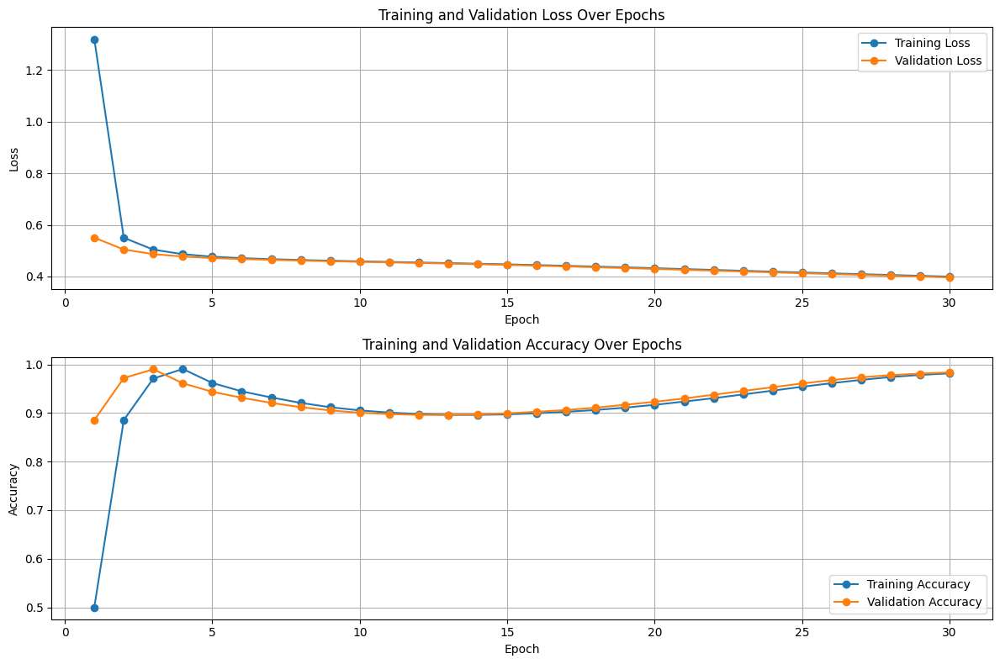

In [20]:
import matplotlib.pyplot as plt

# Generate chart
plt.figure(figsize=(12, 8))

# 📉 Loss Plot
plt.subplot(2, 1, 1)
plt.plot(range(1, len(train_losses) + 1), train_losses, label='Training Loss', marker='o')
plt.plot(range(1, len(val_losses) + 1), val_losses, label='Validation Loss', marker='o')
plt.title('Training and Validation Loss Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)

# 📈 Accuracy Plot
plt.subplot(2, 1, 2)
plt.plot(range(1, len(train_accuracies) + 1), train_accuracies, label='Training Accuracy', marker='o')
plt.plot(range(1, len(val_accuracies) + 1), val_accuracies, label='Validation Accuracy', marker='o')
plt.title('Training and Validation Accuracy Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)

plt.tight_layout()

# ✅ Save to charts directory
chart_path = os.path.join(CHART_OUTPUT_DIR, f"ml_training_chart_batch_{BATCH_INDEX + 1:02d}.png")
plt.savefig(chart_path)
print(f"[INFO] Chart saved to: {chart_path}")

# ✅ Still display it
plt.show()


### Predict the blocks

In [21]:
def predict_embedding_blocks_strict(model, dct_blocks_info, saliency_map, block_size=8, min_dct_variance=5.0, threshold=0.6):
    """
    Predict good blocks for embedding using a DL model + post-filtering with DCT variance.

    Args:
        model (torch.nn.Module): Trained DL model
        dct_blocks_info (list): List of 8x8 DCT block dicts
        saliency_map (ndarray): Normalized saliency map
        block_size (int): Block size (default 8)
        min_dct_variance (float): Min DCT variance allowed (post-filter)
        threshold (float): DL confidence threshold for embedding

    Returns:
        selected_blocks (list): DL-predicted + variance-checked blocks
    """
    model.eval()
    selected_blocks = []

    for block in dct_blocks_info:
        i, j = block["block_position"]
        dct_block = block["dct_block"]

        y_start = i * block_size
        x_start = j * block_size
        block_saliency = saliency_map[y_start:y_start+block_size, x_start:x_start+block_size]

        avg_sal = np.mean(block_saliency)
        entropy = shannon_entropy(block_saliency)
        dct_var = np.var(dct_block[2:6, 2:6, :])  # Focused frequency band

        # DL Prediction
        features = torch.tensor([[avg_sal, entropy, dct_var]], dtype=torch.float32)
        with torch.no_grad():
            confidence = model(features).item()

        # Post-filter
        if confidence > threshold and dct_var > min_dct_variance:
            selected_blocks.append(block)

    return selected_blocks


ai_selected_blocks_per_image = []

for idx in range(len(dct_blocks_per_image)):
    print(f"AI selecting blocks for Image {idx+1}")

    dct_blocks = dct_blocks_per_image[idx]
    sal_map = saliency_maps[idx] / 255.0 if saliency_maps[idx].max() > 1.0 else saliency_maps[idx]

    selected_blocks = predict_embedding_blocks_strict(model, dct_blocks, sal_map)

    ai_selected_blocks_per_image.append(selected_blocks)

    print(f"Selected {len(selected_blocks)} / {len(dct_blocks)} blocks")


AI selecting blocks for Image 1
Selected 128 / 307 blocks
AI selecting blocks for Image 2
Selected 399 / 475 blocks
AI selecting blocks for Image 3
Selected 118 / 591 blocks
AI selecting blocks for Image 4
Selected 521 / 529 blocks
AI selecting blocks for Image 5
Selected 625 / 627 blocks
AI selecting blocks for Image 6
Selected 339 / 414 blocks
AI selecting blocks for Image 7
Selected 605 / 628 blocks
AI selecting blocks for Image 8
Selected 239 / 406 blocks
AI selecting blocks for Image 9
Selected 146 / 453 blocks
AI selecting blocks for Image 10
Selected 599 / 603 blocks
AI selecting blocks for Image 11
Selected 447 / 453 blocks
AI selecting blocks for Image 12
Selected 696 / 747 blocks
AI selecting blocks for Image 13
Selected 463 / 773 blocks
AI selecting blocks for Image 14
Selected 609 / 644 blocks
AI selecting blocks for Image 15
Selected 129 / 652 blocks
AI selecting blocks for Image 16
Selected 570 / 688 blocks
AI selecting blocks for Image 17
Selected 180 / 469 blocks
AI sel

In [22]:
def draw_ai_selected_blocks_on_images(images, ai_selected_blocks_per_image, block_size=8, color=(0, 255, 0)):
    """
    Overlay AI-selected 8x8 blocks on images.

    Args:
        images (list): List of original images (uint8).
        ai_selected_blocks_per_image (list): List of lists of selected blocks per image.
        block_size (int): Size of each block (default 8).
        color (tuple): BGR color for block outlines (default green).
    
    Returns:
        overlay_images (list): Images with blocks drawn.
    """
    overlay_images = []

    for idx, (image, selected_blocks) in enumerate(zip(images, ai_selected_blocks_per_image)):
        img_copy = image.copy()

        for block in selected_blocks:
            i, j = block["block_position"]
            y_start = i * block_size
            x_start = j * block_size
            cv2.rectangle(img_copy, (x_start, y_start), (x_start + block_size, y_start + block_size), color, 1)

        overlay_images.append(img_copy)

    return overlay_images

# Normalize originals to uint8 if needed
originals_uint8 = [(img * 255).astype(np.uint8) if img.max() <= 1.0 else img for img in sample_images]

ai_overlay_images = draw_ai_selected_blocks_on_images(
    images=originals_uint8,
    ai_selected_blocks_per_image=ai_selected_blocks_per_image
)


[INFO] Overlay figure saved to: SteganoGAN/logs/charts/overlay_batch_01.png


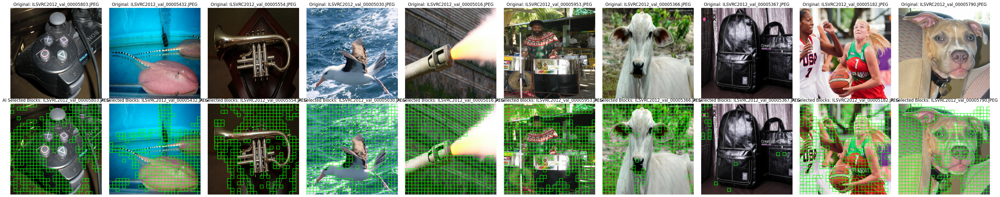

In [23]:
def show_ai_overlay_results(originals, overlays, titles, sample_size=10):
    # Randomly select a sample of images
    num = min(sample_size, len(originals))
    selected_indices = random.sample(range(len(originals)), num)

    # Filter the originals, overlays, and titles based on the selected indices
    sampled_originals = [originals[i] for i in selected_indices]
    sampled_overlays = [overlays[i] for i in selected_indices]
    sampled_titles = [titles[i] for i in selected_indices]

    fig, axes = plt.subplots(2, num, figsize=(num * 4, 8))

    if num == 1:
        axes = np.array(axes).reshape(2, 1)

    for i in range(num):
        axes[0, i].imshow(sampled_originals[i])
        axes[0, i].set_title(f"Original: {sampled_titles[i]}")
        axes[0, i].axis('off')

        axes[1, i].imshow(sampled_overlays[i])
        axes[1, i].set_title(f"AI Selected Blocks: {sampled_titles[i]}")
        axes[1, i].axis('off')

    plt.tight_layout()

    # ✅ Save to CHART_OUTPUT_DIR
    overlay_path = os.path.join(CHART_OUTPUT_DIR, f"overlay_batch_{BATCH_INDEX + 1:02d}.png")
    plt.savefig(overlay_path)
    print(f"[INFO] Overlay figure saved to: {overlay_path}")

    # ✅ Show in notebook
    plt.show()


show_ai_overlay_results(originals_uint8, ai_overlay_images, titles)


### Sanity Check & Visualize DCT Coefficients

[INFO] DCT visualization saved to: SteganoGAN/logs/charts/example_dct_block_batch_01.png


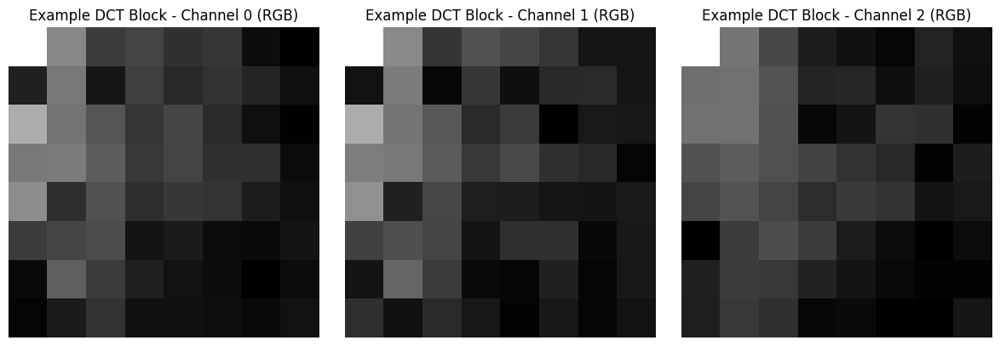

In [24]:
def visualize_dct_block(dct_block, title_prefix="DCT Block"):
    """
    Visualize the magnitude spectrum of a single DCT 8x8 block (RGB channels),
    and save the plot to the charts directory.

    Args:
        dct_block (numpy array): 8x8x3 DCT coefficients.
        title_prefix (str): Prefix for subplot titles and filename.
    """
    fig, axes = plt.subplots(1, 3, figsize=(12, 4))

    for c in range(3):
        # Take absolute value and log scale for visualization
        dct_magnitude = np.log(np.abs(dct_block[:, :, c]) + 1)
        axes[c].imshow(dct_magnitude, cmap='gray')
        axes[c].set_title(f"{title_prefix} - Channel {c} (RGB)")
        axes[c].axis('off')

    plt.tight_layout()

    # ✅ Save chart
    safe_title = title_prefix.replace(" ", "_").lower()
    dct_path = os.path.join(CHART_OUTPUT_DIR, f"{safe_title}_batch_{BATCH_INDEX + 1:02d}.png")
    plt.savefig(dct_path)
    print(f"[INFO] DCT visualization saved to: {dct_path}")

    # ✅ Show plot in notebook
    plt.show()


if dct_blocks_per_image and len(dct_blocks_per_image[0]) > 0:
    if ai_selected_blocks_per_image[0]:
        example_dct_block = ai_selected_blocks_per_image[0][0]["dct_block"]
    visualize_dct_block(example_dct_block, title_prefix="Example DCT Block")
else:
    print("No DCT blocks found to visualize.")


## Step 8: Select Mid-Mid DCT Frequencies for Embedding

- From each **8x8 DCT block** inside your good **16x16 blocks**,  
  we select specific **mid-frequency coefficients** to embed your data.

- We'll **adaptively embed**, considering the **QnT values** we extracted earlier (from Step 6).

---

#### **What We’ll Do**

1. Define a list of **mid-mid frequency positions**  
2. For each DCT block, **select those positions**  
3. Apply **QnT-based decision logic**:
    - Skip **low Q** (highly sensitive)  
    - Allow changes in **mid/high Q**  
4. Prepare to **embed bits** in these coefficients in the next step.


### Code Block #1: Define Mid-Mid Frequencies

In [25]:
# Mid-mid frequency positions (Y-axis first)
mid_mid_frequencies = [(3, 3), (2, 3), (3, 2), (4, 1), (1, 4)]

### Code Block #2: Adaptive Embedding Decision Function

In [26]:
def should_embed(q_value, q_threshold_low=4, q_threshold_high=8):
    """
    Decide whether to embed based on quantization value.

    Args:
        q_value (int): Quantization table value at that frequency.
        q_threshold_low (int): Lower threshold (too sensitive to modify).
        q_threshold_high (int): Upper threshold (safe for stronger changes).

    Returns:
        bool: True if we should embed here, False otherwise.
    """
    if q_value <= q_threshold_low:
        return False  # Too sensitive, skip
    elif q_value <= q_threshold_high:
        return True   # Safe for minimal embedding (±1)
    else:
        return True   # Safe for stronger embedding (±1 or ±2)


### Code Block #3: Select Embedding Positions in DCT Blocks


In [27]:
def select_embedding_positions_8x8(dct_blocks_per_image, qtables_list, mid_mid_frequencies):
    """
    Select positions in 8x8 DCT blocks where we can embed data.

    Args:
        dct_blocks_per_image (list): List of DCT blocks per image (after 8x8 processing).
        qtables_list (list): Quantization tables (one per image).
        mid_mid_frequencies (list): (y, x) tuples indicating DCT frequencies to consider.

    Returns:
        embedding_candidates_per_image (list): For each image, list of embedding positions.
    """
    embedding_candidates_per_image = []

    for img_idx, (dct_blocks_info, qtables) in enumerate(zip(dct_blocks_per_image, qtables_list)):
        print(f"\nSelecting embedding positions for Image {img_idx+1}")

        if qtables is None:
            print("No Q-table found. Skipping.")
            embedding_candidates_per_image.append([])
            continue

        qtable = np.array(qtables[0]).reshape((8, 8))  # Use luminance table
        candidates_for_image = []

        for block_info in dct_blocks_info:
            block_position = block_info['block_position']
            dct_block = block_info['dct_block']  # This is the full 8x8 DCT block

            candidates = []

            for (y, x) in mid_mid_frequencies:
                q_value = qtable[y, x]

                if should_embed(q_value):
                    candidates.append({
                        "block_position": block_position,
                        "freq": (y, x),
                        "q_value": q_value
                    })

            if candidates:
                candidates_for_image.append(candidates)

        print(f"Found {len(candidates_for_image)} blocks with embedding spots in Image {img_idx+1}")
        embedding_candidates_per_image.append(candidates_for_image)

    return embedding_candidates_per_image

embed_log_path = os.path.join(LOG_DIR, "embedding_selection_log.txt")

log_buffer = StringIO()
with redirect_stdout(log_buffer):
    print(f"\n=== [Batch {BATCH_INDEX + 1}] Embedding Position Selection Log ===")
    
    embedding_candidates_per_image = select_embedding_positions_8x8(
        dct_blocks_per_image,
        qtables_list,
        mid_mid_frequencies
    )

# Write log output to file
with open(embed_log_path, "a") as logf:
    logf.write(log_buffer.getvalue())


print(log_buffer.getvalue())


=== [Batch 1] Embedding Position Selection Log ===

Selecting embedding positions for Image 1
Found 0 blocks with embedding spots in Image 1

Selecting embedding positions for Image 2
Found 0 blocks with embedding spots in Image 2

Selecting embedding positions for Image 3
Found 0 blocks with embedding spots in Image 3

Selecting embedding positions for Image 4
Found 0 blocks with embedding spots in Image 4

Selecting embedding positions for Image 5
Found 0 blocks with embedding spots in Image 5

Selecting embedding positions for Image 6
Found 414 blocks with embedding spots in Image 6

Selecting embedding positions for Image 7
Found 0 blocks with embedding spots in Image 7

Selecting embedding positions for Image 8
Found 0 blocks with embedding spots in Image 8

Selecting embedding positions for Image 9
Found 0 blocks with embedding spots in Image 9

Selecting embedding positions for Image 10
Found 0 blocks with embedding spots in Image 10

Selecting embedding positions for Image 11


### Code Block #4: Filter Images With Opportunities

In [28]:
def filter_images_with_candidates(embedding_candidates_per_image, dct_blocks_per_image, sample_image_paths, titles, payloads, bits_per_block=4):
    """
    Filters out images that have no embedding candidates and displays details of remaining images.

    Args:
        embedding_candidates_per_image (list): List of candidates per image.
        dct_blocks_per_image (list): List of DCT block info per image.
        sample_image_paths (list): Original file paths.
        titles (list): Titles for each image.
        payloads (list): Payload bits for each image.
        bits_per_block (int): Number of bits that can be embedded per block.

    Returns:
        filtered_candidates (list)
        filtered_dct_blocks (list)
        filtered_image_paths (list)
        filtered_titles (list)
        filtered_payloads (list)
    """
    filtered_candidates = []
    filtered_dct_blocks = []
    filtered_image_paths = []
    filtered_titles = []
    filtered_payloads = []

    for idx, candidates in enumerate(embedding_candidates_per_image):
        if len(candidates) > 0:
            filtered_candidates.append(candidates)
            filtered_dct_blocks.append(dct_blocks_per_image[idx])
            filtered_image_paths.append(sample_image_paths[idx])
            filtered_titles.append(titles[idx])
            filtered_payloads.append(payloads[idx])

    print(f"\nFiltered {len(embedding_candidates_per_image) - len(filtered_candidates)} images with zero embedding opportunities.")
    print(f"Remaining images for embedding: {len(filtered_candidates)}")

    return filtered_candidates, filtered_dct_blocks, filtered_image_paths, filtered_titles, filtered_payloads

filter_log_path = os.path.join(LOG_DIR, "filter_log.txt")

log_buffer = StringIO()
with redirect_stdout(log_buffer):
    print(f"\n=== [Batch {BATCH_INDEX + 1}] Embedding Candidate Filtering Log ===")

    (
        filtered_candidates_per_image,
        filtered_dct_blocks_per_image,
        filtered_sample_image_paths,
        filtered_titles,
        filtered_payloads
    ) = filter_images_with_candidates(
        embedding_candidates_per_image,
        dct_blocks_per_image,
        batch_paths,
        titles,
        payloads
    )

# Save log output
with open(filter_log_path, "a") as logf:
    logf.write(log_buffer.getvalue())

# Optionally also show it
print(log_buffer.getvalue())


=== [Batch 1] Embedding Candidate Filtering Log ===

Filtered 856 images with zero embedding opportunities.
Remaining images for embedding: 144



### Code Block #4: Sanity Check - Visualize Candidate Counts Per Image

[INFO] Embedding candidate chart saved to: SteganoGAN/logs/charts/embedding_candidates_batch_01.png


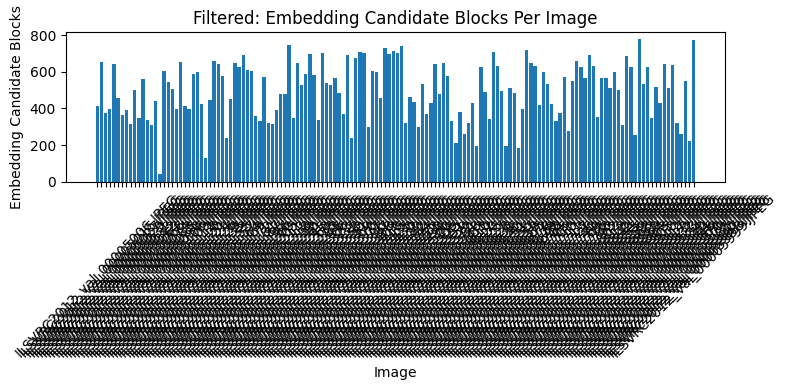

In [29]:
def visualize_filtered_embedding_candidates(filtered_candidates_per_image, filtered_titles):
    """
    Plot number of embedding candidate blocks for filtered images,
    and save the chart to the charts directory.

    Args:
        filtered_candidates_per_image (list): Filtered candidate data.
        filtered_titles (list): Titles for remaining images.
    """
    num_blocks = [len(candidates) for candidates in filtered_candidates_per_image]

    plt.figure(figsize=(8, 4))
    plt.bar(range(len(num_blocks)), num_blocks, tick_label=filtered_titles)
    plt.title("Filtered: Embedding Candidate Blocks Per Image")
    plt.xlabel("Image")
    plt.ylabel("Embedding Candidate Blocks")
    plt.xticks(rotation=45)

    # ✅ Save chart
    chart_path = os.path.join(CHART_OUTPUT_DIR, f"embedding_candidates_batch_{BATCH_INDEX + 1:02d}.png")
    plt.tight_layout()
    plt.savefig(chart_path)
    print(f"[INFO] Embedding candidate chart saved to: {chart_path}")

    # ✅ Show plot
    plt.show()

visualize_filtered_embedding_candidates(filtered_candidates_per_image, filtered_titles)



## Step 9: Embed Payload Bits into the Selected DCT Coefficients


#### Step 9 - tasks


- Embed your **payload bits** into the **mid-mid DCT coefficients** of each good block,  
  for each image that has embedding opportunities.

- Use the **4-8 QnT bandwidth** to guide **safe embedding**.

- Modify coefficients **gently**:
    - **LSB modification**  
    - Minimal **±1 tweak**

- Keep track of **how many bits** we’ve embedded per image.

- Prep for **reconstruction** in the next step (**inverse DCT**).


### Code Block #1: The Embed Function (Revised and Cleaned Up)


In [30]:
def embed_bits_in_dct_blocks_8x8(dct_blocks_info, embedding_candidates, payload_bits, low_threshold=4, high_threshold=8):
    """
    Embed bits into DCT coefficients of 8x8 blocks.

    Args:
        dct_blocks_info (list): DCT blocks for a single image.
        embedding_candidates (list): List of embedding spots per block.
        payload_bits (numpy array): Bitstream to embed.
        low_threshold (int): Minimum Q value allowed.
        high_threshold (int): Maximum Q value allowed.

    Returns:
        modified_dct_blocks_info (list): DCT blocks with embedded payload.
        num_embedded_bits (int): Number of bits actually embedded.
    """
    bit_idx = 0
    max_bits = len(payload_bits)
    import copy
    modified_dct_blocks_info = copy.deepcopy(dct_blocks_info)

    print(f"\nEmbedding up to {max_bits} bits in current image...")

    print(f"\n[Embedding Step] Total candidate blocks: {len(embedding_candidates)}")
    skipped_blocks = 0

    for block_candidates in embedding_candidates:
        block_position = block_candidates[0]['block_position']
        print(f"  Block: {block_position} has {len(block_candidates)} candidate frequencies")
        
        # Create a mapping from block positions to indices
        block_pos_to_index = {block["block_position"]: idx for idx, block in enumerate(dct_blocks_info)}

        block_idx = block_pos_to_index.get(block_position)
        if block_idx is None:
            print(f"    ⚠️ Block position {block_position} not found!")
            continue

        # Retrieve the DCT block corresponding to the current block position
        dct_block = modified_dct_blocks_info[block_idx]["dct_block"]

        for candidate in block_candidates:
            y, x = candidate['freq']
            q_value = candidate['q_value']

            if not (low_threshold <= q_value <= high_threshold):
                print(f"    Skipping freq ({y},{x}) with Q={q_value}")
                skipped_blocks += 1
                continue

            print(f"    ✅ Embedding bit at freq ({y},{x}), Q={q_value}")

            if low_threshold <= q_value <= high_threshold:
                if bit_idx >= max_bits:
                    print("All payload bits embedded!")
                    return modified_dct_blocks_info, bit_idx

                for channel in range(3):  # R, G, B
                    coeff = int(round(dct_block[y, x, channel]))
                    if coeff >= 0:
                        new_coeff = (coeff & ~1) | payload_bits[bit_idx]
                    else:
                        new_coeff = -((abs(coeff) & ~1) | payload_bits[bit_idx])

                    dct_block[y, x, channel] = float(new_coeff)

                    # print(f"Embedded bit {payload_bits[bit_idx]} at block {block_position}, freq ({y},{x}), channel {channel}, Q={q_value}")
                    bit_idx += 1

                    if bit_idx >= max_bits:
                        break

            else:
                # print(f"Skipping freq ({y},{x}) due to Q={q_value}")
                pass

        if bit_idx >= max_bits:
            break

    print(f"Finished embedding {bit_idx} bits in this image.")
    return modified_dct_blocks_info, bit_idx


### EXTRACTION FUNCTION

In [31]:
def extract_message_dct(embedding_candidates, dct_blocks_info, secret_key=None):
    # 1) collect bits in the exact order you embedded them
    bits = []
    for block_candidates, block_info in zip(embedding_candidates, dct_blocks_info):
        dct_block = block_info["dct_block"]
        for candidate in block_candidates:
            y, x = candidate["freq"]
            for channel in (0,1,2):
                bits.append(str(int(dct_block[y,x,channel]) & 1))

    # 2) header
    signature = int("".join(bits[:16]), 2)
    length    = int("".join(bits[16:48]), 2)
    if signature != 0xBEEF:
        print(f"⚠️ Signature mismatch: expected 0xBEEF, got 0x{signature:04X}")

    # 3) payload
    start = 16 + 32
    end   = start + length
    msg_bits = bits[start:end]

    # 4) rebuild
    message_bytes = bytearray()
    for i in range(0, len(msg_bits), 8):
        byte_chunk = msg_bits[i:i+8]
        message_bytes.append(int("".join(byte_chunk), 2))

    try:
        message = message_bytes.decode("utf-8")
    except UnicodeDecodeError:
        message = message_bytes.decode("utf-8", errors="replace")
        print("⚠️ Decoding error, message may be corrupted")
    print(f"✅ Extracted message: '{message}'")
    return message

### Code Block #2: Loop Through All Images and Embed Payloads

In [32]:
# === Cell B: Embed & Dump Features ONLY for images that got >0 bits ===
from io import StringIO
from contextlib import redirect_stdout
import numpy as np, copy, pickle, os

# suppress DCT overflow warnings
old_err = np.geterr()
np.seterr(over="ignore")

# Setup
LOG_DIR      = "./SteganoGAN/logs"
FEATURES_DIR = "extraction_features"
os.makedirs(FEATURES_DIR, exist_ok=True)

log_buffer                    = StringIO()
embedding_log_path            = os.path.join(LOG_DIR, "embedding_log.txt")
modified_dct_blocks_per_image = []
embedded_bits_per_image       = []
embedded_indices_for_dump     = []

with redirect_stdout(log_buffer):
    print(f"\n=== [Batch {BATCH_INDEX+1}] Embedding Log ===")

    for idx, (title, cand, dct_b, bits) in enumerate(zip(
        filtered_titles,
        filtered_candidates_per_image,
        filtered_dct_blocks_per_image,
        payloads
    )):
        print(f"\nEmbedding {title} ({idx+1}/{len(filtered_titles)})")
        stego_blocks, n_bits = embed_bits_in_dct_blocks_8x8(
            dct_blocks_info      = copy.deepcopy(dct_b),
            embedding_candidates = cand,
            payload_bits         = np.array(bits, dtype=np.uint8),
            low_threshold        = 4,
            high_threshold       = 8
        )
        print(f"  → {n_bits}/{len(bits)} bits embedded")

        # Always keep blocks & counts aligned
        modified_dct_blocks_per_image.append(stego_blocks)
        embedded_bits_per_image.append(n_bits)

        # Only dump features & record index if we got >0 bits
        if n_bits > 0:
            feat_path = os.path.join(FEATURES_DIR, f"{title}_features.pkl")
            with open(feat_path, "wb") as f:
                pickle.dump((cand, stego_blocks), f)
            embedded_indices_for_dump.append(idx)
            print(f"🔖 Saved features for {title}")
        else:
            print(f"⚠️ No bits in {title}; skipping feature dump.")

# restore warnings
np.seterr(**old_err)

# write & print log
with open(embedding_log_path, "a") as logf:
    logf.write(log_buffer.getvalue())
print("Done embedding - see log for details.")

print(f"→ Total images processed: {len(filtered_titles)}")
print(f"→ Stego blocks saved:       {len(modified_dct_blocks_per_image)}")
print(f"→ Images with features:     {len(embedded_indices_for_dump)}")
print(f"→ Bits per image snippet:   {embedded_bits_per_image[:5]} …")

Done embedding - see log for details.
→ Total images processed: 144
→ Stego blocks saved:       144
→ Images with features:     63
→ Bits per image snippet:   [128, 0, 128, 128, 128] …


### Code Block #3: Visual Check / Summary of Embedding

In [33]:
# Summary of embedding per image
for idx, num_bits in enumerate(embedded_bits_per_image):
    print(f"Image {idx+1}: {filtered_titles[idx]} - {num_bits} bits embedded.")


Image 1: ILSVRC2012_val_00005006.JPEG - 128 bits embedded.
Image 2: ILSVRC2012_val_00005015.JPEG - 0 bits embedded.
Image 3: ILSVRC2012_val_00005027.JPEG - 128 bits embedded.
Image 4: ILSVRC2012_val_00005029.JPEG - 128 bits embedded.
Image 5: ILSVRC2012_val_00005031.JPEG - 128 bits embedded.
Image 6: ILSVRC2012_val_00005033.JPEG - 0 bits embedded.
Image 7: ILSVRC2012_val_00005042.JPEG - 128 bits embedded.
Image 8: ILSVRC2012_val_00005063.JPEG - 0 bits embedded.
Image 9: ILSVRC2012_val_00005066.JPEG - 128 bits embedded.
Image 10: ILSVRC2012_val_00005074.JPEG - 0 bits embedded.
Image 11: ILSVRC2012_val_00005083.JPEG - 0 bits embedded.
Image 12: ILSVRC2012_val_00005085.JPEG - 128 bits embedded.
Image 13: ILSVRC2012_val_00005090.JPEG - 128 bits embedded.
Image 14: ILSVRC2012_val_00005106.JPEG - 0 bits embedded.
Image 15: ILSVRC2012_val_00005109.JPEG - 0 bits embedded.
Image 16: ILSVRC2012_val_00005112.JPEG - 0 bits embedded.
Image 17: ILSVRC2012_val_00005118.JPEG - 128 bits embedded.
Image

## Step 10: Inverse DCT and Reconstruct the Stego Images

### Code Block #1: Helper Function to Rebuild 16x16 Blocks from Modified DCT Blocks

In [34]:
def dct_block_to_spatial_block_8x8(dct_block):
    """
    Perform inverse DCT on a single 8x8x3 DCT block.

    Args:
        dct_block (numpy array): 8x8x3 DCT block.

    Returns:
        spatial_block (numpy array): 8x8x3 spatial block (uint8).
    """
    spatial_block = np.zeros_like(dct_block, dtype=np.float32)

    for c in range(3):  # For each RGB channel
        spatial_block[:, :, c] = cv2.idct(dct_block[:, :, c])

    # Clip values and convert to uint8 for image display
    spatial_block = np.clip(spatial_block, 0, 255).astype(np.uint8)
    return spatial_block


### Code Block #2: Reconstruct the Entire Image From Modified Blocks

In [35]:
def reconstruct_image_from_dct_blocks_8x8(original_image, modified_dct_blocks_info, block_size=8):
    """
    Reconstruct the stego image from modified 8x8 DCT blocks.

    Args:
        original_image (numpy array): The original RGB image (uint8).
        modified_dct_blocks_info (list): List of modified DCT blocks (with 'block_position' and 'dct_block').
        block_size (int): Block size (default 8).

    Returns:
        reconstructed_image (numpy array): The stego image reconstructed from DCT blocks.
    """
    reconstructed_image = original_image.copy()

    for block_info in modified_dct_blocks_info:
        block_position = block_info['block_position']
        dct_block = block_info['dct_block']

        # Inverse DCT to get spatial block
        spatial_block = dct_block_to_spatial_block_8x8(dct_block)

        # Map it back to the image
        y_start = block_position[0] * block_size
        x_start = block_position[1] * block_size

        reconstructed_image[y_start:y_start+block_size, x_start:x_start+block_size, :] = spatial_block

    return reconstructed_image


### EXTRACTION FUNCTION

### Code Block #3: Reconstruct and Display Stego Images Side by Side

In [36]:
def display_original_and_stego_images_8x8(filtered_sample_images, reconstructed_images, filtered_titles):
    """
    Display original and stego images side by side for visual comparison.

    Args:
        filtered_sample_images (list): List of original RGB images (normalized or uint8).
        reconstructed_images (list): List of reconstructed stego RGB images (uint8).
        filtered_titles (list): List of titles for each image.
    """
    num_images = len(filtered_sample_images)
    fig, axes = plt.subplots(2, num_images, figsize=(num_images * 4, 8))

    if num_images == 1:
        axes = np.array(axes).reshape(2, 1)

    for i in range(num_images):
        # Normalize if needed
        original_img = (filtered_sample_images[i] * 255).astype(np.uint8) if filtered_sample_images[i].max() <= 1.0 else filtered_sample_images[i]
        stego_img = reconstructed_images[i]

        axes[0, i].imshow(original_img)
        axes[0, i].set_title(f"Original: {filtered_titles[i]}")
        axes[0, i].axis('off')

        axes[1, i].imshow(stego_img)
        axes[1, i].set_title(f"Stego: {filtered_titles[i]}")
        axes[1, i].axis('off')

    plt.tight_layout()
    plt.show()


### Code Block #4: Reconstruct Images and Run the Display

In [37]:
def load_filtered_images_8x8(filtered_image_paths, target_size=(224, 224)):
    """
    Load and preprocess filtered images from file paths.

    Args:
        filtered_image_paths (list): List of image file paths.
        target_size (tuple): Resize dimensions, default (224, 224).

    Returns:
        filtered_sample_images (list): List of normalized RGB images.
    """
    filtered_sample_images = []

    for path in filtered_image_paths:
        img = Image.open(path).convert("RGB")
        img = img.resize(target_size)
        img_array = np.array(img) / 255.0  # Normalize to [0,1]
        filtered_sample_images.append(img_array)

    print(f"✅ Loaded and preprocessed {len(filtered_sample_images)} images at size {target_size}")
    return filtered_sample_images

image_load_log_path = os.path.join(LOG_DIR, "image_loading_log.txt")

log_buffer = StringIO()
with redirect_stdout(log_buffer):
    print(f"\n=== [Batch {BATCH_INDEX + 1}] Image Loading Log ===")
    filtered_sample_images = load_filtered_images_8x8(filtered_sample_image_paths)

# Write to log file
with open(image_load_log_path, "a") as logf:
    logf.write(log_buffer.getvalue())

# Show in notebook (optional)
print(log_buffer.getvalue())



=== [Batch 1] Image Loading Log ===
✅ Loaded and preprocessed 144 images at size (224, 224)



In [38]:
# === Cell E: Reconstruct ONLY those images in embedded_indices_for_dump ===
reconstructed = []
reconstructed_titles = []

for idx in embedded_indices_for_dump:
    title = filtered_titles[idx]
    orig  = filtered_sample_images[idx]
    orig_uint8 = (orig * 255).astype(np.uint8) if orig.max() <= 1.0 else orig

    stego_img = reconstruct_image_from_dct_blocks_8x8(
        original_image          = orig_uint8,
        modified_dct_blocks_info= modified_dct_blocks_per_image[idx]
    )
    if stego_img is None:
        raise RuntimeError(f"Reconstruction failed for {title}")
    reconstructed.append(stego_img)
    reconstructed_titles.append(title)

print(f"✅ Reconstructed {len(reconstructed)} stego images out of {len(embedded_indices_for_dump)}")

✅ Reconstructed 63 stego images out of 63


## Step 11: Evaluate Image Quality - PSNR & SSIM & MSE

### Code Block #1: Setup PSNR & SSIM Functions

In [39]:
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.metrics import structural_similarity as ssim
import numpy as np

def evaluate_stego_images(filtered_sample_images, reconstructed_images, filtered_titles):
    """
    Evaluate PSNR, SSIM, and MSE between original and stego images.

    Args:
        filtered_sample_images (list): List of original images (normalized RGB arrays).
        reconstructed_images (list): List of reconstructed stego images (uint8).
        filtered_titles (list): Titles for each image.

    Returns:
        evaluation_results (list): List of dicts with PSNR, SSIM, and MSE per image.
    """
    evaluation_results = []

    for idx in range(len(filtered_sample_images)):
        # Prepare original and stego images in uint8
        original_img = (filtered_sample_images[idx] * 255).astype(np.uint8) if filtered_sample_images[idx].max() <= 1.0 else filtered_sample_images[idx]
        stego_img = reconstructed_images[idx]

        # PSNR (computed on full RGB images)
        psnr_value = psnr(original_img, stego_img, data_range=255)

        # SSIM (computed on full RGB images)
        ssim_value = ssim(
            original_img,
            stego_img,
            channel_axis=-1,   # Instead of multichannel=True
            data_range=255
        )

        # MSE (Mean Squared Error)
        mse_value = np.mean((original_img.astype("float32") - stego_img.astype("float32")) ** 2)

        result = {
            "Image": filtered_titles[idx],
            "PSNR (dB)": round(psnr_value, 2),
            "SSIM": round(ssim_value, 4),
            "MSE": round(mse_value, 4)
        }

        evaluation_results.append(result)

        print(f"Evaluated {filtered_titles[idx]} --> PSNR: {result['PSNR (dB)']} dB, SSIM: {result['SSIM']}, MSE: {result['MSE']}")

    return evaluation_results


### Only Eval Stuff Embedded 

In [40]:
# Prepare matched originals & titles
origins_for_eval = [filtered_sample_images[i] for i in embedded_indices_for_dump]


### Code Block #2: Run Evaluation on Your Images

In [41]:
evaluation_results = evaluate_stego_images(
    filtered_sample_images = origins_for_eval,
    reconstructed_images   = reconstructed,
    filtered_titles        = reconstructed_titles
)



Evaluated ILSVRC2012_val_00005006.JPEG --> PSNR: 34.14 dB, SSIM: 0.9934, MSE: 25.040000915527344
Evaluated ILSVRC2012_val_00005027.JPEG --> PSNR: 35.6 dB, SSIM: 0.9895, MSE: 17.91939926147461
Evaluated ILSVRC2012_val_00005029.JPEG --> PSNR: 35.03 dB, SSIM: 0.994, MSE: 20.400100708007812
Evaluated ILSVRC2012_val_00005031.JPEG --> PSNR: 38.44 dB, SSIM: 0.9867, MSE: 9.313799858093262
Evaluated ILSVRC2012_val_00005042.JPEG --> PSNR: 41.39 dB, SSIM: 0.9985, MSE: 4.72130012512207
Evaluated ILSVRC2012_val_00005066.JPEG --> PSNR: 67.3 dB, SSIM: 1.0, MSE: 0.01209999993443489
Evaluated ILSVRC2012_val_00005085.JPEG --> PSNR: 44.98 dB, SSIM: 0.9965, MSE: 2.0659000873565674
Evaluated ILSVRC2012_val_00005090.JPEG --> PSNR: 34.69 dB, SSIM: 0.9782, MSE: 22.10409927368164
Evaluated ILSVRC2012_val_00005118.JPEG --> PSNR: 39.16 dB, SSIM: 0.9872, MSE: 7.8815999031066895
Evaluated ILSVRC2012_val_00005121.JPEG --> PSNR: 39.23 dB, SSIM: 0.9949, MSE: 7.7683000564575195
Evaluated ILSVRC2012_val_00005124.JPEG -

### Code Block #3: Visualize The Scores


In [42]:
import pandas as pd

def display_evaluation_results(evaluation_results):
    """
    Display the evaluation results in a table.

    Args:
        evaluation_results (list): List of dicts with evaluation data.
    """
    df = pd.DataFrame(evaluation_results)
    display(df)

df_eval = pd.DataFrame(evaluation_results)

# ✅ Display in notebook (unchanged)
display(df_eval)

# ✅ Save to plain-text log file
eval_table_log_path = os.path.join(LOG_DIR, "evaluation_table_log.txt")
with open(eval_table_log_path, "a") as logf:
    logf.write(f"\n=== [Batch {BATCH_INDEX + 1}] Evaluation Table (Plain Text) ===\n")
    logf.write(df_eval.to_string(index=False))
    logf.write("\n")

# ✅ Save to CSV for structured tracking
csv_path = os.path.join(LOG_DIR, f"evaluation_table_batch_{BATCH_INDEX + 1:02d}.csv")
df_eval.to_csv(csv_path, index=False)
print(f"[INFO] Evaluation table saved to:\n- TXT: {eval_table_log_path}\n- CSV: {csv_path}")


,Image,PSNR (dB),SSIM,MSE
0,ILSVRC2012_val_00005006.JPEG,34.14,0.9934,25.040001
1,ILSVRC2012_val_00005027.JPEG,35.60,0.9895,17.919399
2,ILSVRC2012_val_00005029.JPEG,35.03,0.9940,20.400101
3,ILSVRC2012_val_00005031.JPEG,38.44,0.9867,9.313800
4,ILSVRC2012_val_00005042.JPEG,41.39,0.9985,4.721300
...,...,...,...,...
58,ILSVRC2012_val_00005946.JPEG,35.34,0.9898,19.000500
59,ILSVRC2012_val_00005979.JPEG,35.78,0.9933,17.168100
60,ILSVRC2012_val_00005990.JPEG,51.53,0.9994,0.457400
61,ILSVRC2012_val_00005998.JPEG,36.97,0.9920,13.070100


[INFO] Evaluation table saved to:
- TXT: ./SteganoGAN/logs/evaluation_table_log.txt
- CSV: ./SteganoGAN/logs/evaluation_table_batch_01.csv


###   Code Block: Save Stego Images (PNG or JPEG)

In [43]:
origins_to_save = [filtered_sample_images[i] for i in embedded_indices_for_dump]

# 2) Use the reconstructed & title lists you already built
#    (we called those `reconstructed` and `reconstructed_titles`)
from PIL import Image
import os

def save_original_and_stego_images(orig_list, stego_list, titles, save_dir="image_outputs_final", fmt="jpeg", quality=90):
    originals_dir = os.path.join(save_dir, "originals")
    stegos_dir    = os.path.join(save_dir, "stegos")
    os.makedirs(originals_dir, exist_ok=True)
    os.makedirs(stegos_dir,    exist_ok=True)

    for img, stego_img, title in zip(orig_list, stego_list, titles):
        # convert normalized [0–1] back to uint8 if needed
        orig_uint8 = (img * 255).astype("uint8") if img.max() <= 1.0 else img
        orig_pil   = Image.fromarray(orig_uint8)
        stego_pil  = Image.fromarray(stego_img)

        base = os.path.splitext(title)[0]
        orig_path  = os.path.join(originals_dir, f"{base}_original.{fmt}")
        stego_path = os.path.join(stegos_dir,    f"{base}_stego.{fmt}")

        if fmt.lower() == "jpeg":
            orig_pil.save(orig_path,  "JPEG", quality=quality)
            stego_pil.save(stego_path, "JPEG", quality=quality)
        else:
            orig_pil.save(orig_path)
            stego_pil.save(stego_path)

        print(f"✔ Saved {orig_path}")
        print(f"✔ Saved {stego_path}")

# 3) Call it with the correct lists
save_original_and_stego_images(
    origins_to_save,
    reconstructed,
    reconstructed_titles,
    save_dir="image_outputs_final",
    fmt="png",
    quality=90
)

BATCH_INDEX += 1
print(f"✅ Batch complete. Next BATCH_INDEX = {BATCH_INDEX}")


✔ Saved image_outputs_final/originals/ILSVRC2012_val_00005006_original.png
✔ Saved image_outputs_final/stegos/ILSVRC2012_val_00005006_stego.png
✔ Saved image_outputs_final/originals/ILSVRC2012_val_00005027_original.png
✔ Saved image_outputs_final/stegos/ILSVRC2012_val_00005027_stego.png
✔ Saved image_outputs_final/originals/ILSVRC2012_val_00005029_original.png
✔ Saved image_outputs_final/stegos/ILSVRC2012_val_00005029_stego.png
✔ Saved image_outputs_final/originals/ILSVRC2012_val_00005031_original.png
✔ Saved image_outputs_final/stegos/ILSVRC2012_val_00005031_stego.png
✔ Saved image_outputs_final/originals/ILSVRC2012_val_00005042_original.png
✔ Saved image_outputs_final/stegos/ILSVRC2012_val_00005042_stego.png
✔ Saved image_outputs_final/originals/ILSVRC2012_val_00005066_original.png
✔ Saved image_outputs_final/stegos/ILSVRC2012_val_00005066_stego.png
✔ Saved image_outputs_final/originals/ILSVRC2012_val_00005085_original.png
✔ Saved image_outputs_final/stegos/ILSVRC2012_val_00005085_st

### Extract Messages from Images

In [45]:
# === Cell D: Extract from only the saved feature dumps ===
SECRET_KEY = None

print("🔍 Starting hidden‑message extraction…")

original_message = "War Eagle!"  # must exactly match what you embedded
total = len(embedded_indices_for_dump)
correct = 0

for rank, idx in enumerate(embedded_indices_for_dump, start=1):
    title    = filtered_titles[idx]
    feat_path = os.path.join(FEATURES_DIR, f"{title}_features.pkl")

    # load the saved embedding candidates & stego blocks
    cand, stego_blocks = pickle.load(open(feat_path, "rb"))

    # run your extractor
    extracted_msg = extract_message_dct(cand, stego_blocks)

    # count only exact matches
    if extracted_msg == original_message:
        correct += 1
        print(f"{rank}/{total} {title}: ✅ Correctly extracted")
    # else: do nothing for incorrect or corrupted

# final success rate
rate = correct / total * 100 if total else 0
print(f"\n🎯 Extraction success rate: {correct}/{total} ({rate:.1f}%) images exactly matched.")

🔍 Starting hidden‑message extraction…
✅ Extracted message: 'War Eagle!'
1/63 ILSVRC2012_val_00005006.JPEG: ✅ Correctly extracted
✅ Extracted message: 'War Eagle!'
2/63 ILSVRC2012_val_00005027.JPEG: ✅ Correctly extracted
⚠️ Signature mismatch: expected 0xBEEF, got 0xB7DC
⚠️ Decoding error, message may be corrupted
�r��v��-�u��1N�++P�"Fދ�;&i��^�l����`9T�I��^K��!�N�#uU�4x���!cEdd��Ԩh@�渢=��o_��D�4���Q�.��G����F^5.�-�-m�?�t�GQ(��g&��_h�j����Պ�R6�������*��#H�E���<�`-��
�q7�'�4S>����È/�v�^Yd}�,0D5�M�c��B�t�Ў�ث�i��J#M�{\�j���8"80�(i!(=H��1�:8��*��#1E�m�7'L8�v���w���v�z�Q�Ä�Ru���PR!$�G��<R)[��{5���?z��@I2��B��h����dr� �r�#>�.�oL��QۓT��$BTh�/U�T�����Di�;�
⚠️ Signature mismatch: expected 0xBEEF, got 0x06F6
⚠️ Decoding error, message may be corrupted
3�Gq�]� �  ��Lz�=DCy�c�^�? ~ �ˠ�b`����tQ�AB5 �E\ ��Vu���(E�0��q�7��,�h<��G0�$S�~��4V�F� ?���y�)�L��� !PuJ�)�����}ö��YO�ˁ �6�%�D��l(|e��X4W#{K\N$ @p� ��;F\OjD�ߩ